# Research Challenge

<div style="background-color: #f8d7da; border-left: 6px solid #ccc; margin: 20px; padding: 15px;">
    <strong>💡 Margaret Atwood:</strong> Every aspect of human technology has a dark side, including the bow and arrow.
</div>

## 🏅 Build your own model 

You have been assigned one dataset from [MatBench](https://matbench.materialsproject.org) as introduced in the [Lecture slides](https://speakerdeck.com/aronwalsh/mlformaterials-challenge-25). You are free to choose and tune any machine-learning model, with any Python library, but it should be appropriate for the problem. For instance, [XGBoost](https://xgboost.readthedocs.io) could be a good starting starting point to build a regression model. You can refer back to earlier notebooks and repurpose code as needed. 

You may reach the limits of computing processing power on Google Colab. Building a useful model with limited resources is a real-world skill. Using other free resources is allowed if you find an alternative service, as is running on your own computer. A model tracker such as [wandb](https://wandb.ai) could be helpful for advanced users. If you want to try a brute force approach, a library such as [Automatminer](https://hackingmaterials.lbl.gov/automatminer) may be of interest.

This notebook should be used for keeping a record of your model development, submission, and even your presentation. You are free to edit (add/remove/delete) or rearrange the cells as you see fit.

### Your details

- Automatminer - Automatminer is a tool for automatically creating complete machine learning pipelines for materials science, including automatic featurization with matminer, feature reduction, and an AutoML backend. Put in a materials dataset, get out a machine that predicts materials properties.

- https://jocse.org/downloads/jocse-15-1-2.pdf

- Lazy Predict help build a lot of basic models without much code and helps understand which models works better without any parameter tuning https://pypi.org/project/lazypredict/

- benchmarking materials property prediction methods: the Matbench test set and Automatminer reference algorithm 
https://www.nature.com/articles/s41524-020-00406-3

In [10]:
import numpy as np

# Insert your values
Name = "Jiaqi Wang" # Replace with your name
CID = 2028053 # Replace with your College ID (as a numeric value with no leading 0s)

# Set a random seed using the CID value
CID = int(CID)
np.random.seed(CID)

# Print the message
print("This is the work of " + Name + " [CID: " + "0" + str(CID) + "]")

This is the work of Jiaqi Wang [CID: 02028053]


## Problem statement

You have been assigned one dataset from the [list](https://matbench.materialsproject.org/Benchmark%20Info/matbench_v0.1/) on [MatBench](https://matbench.materialsproject.org). You should state what problem you are trying to solve and comment on the best-performing model in the benchmark. 

### Problem to be solved:
Using a regression model, predict the target variable "Refractive Index (n)" in the "MatBench_Dielectric" dataset using the "structure" data. The model hyperparameters will then be optimised and the best versions of each models compared for this application. The most impactful features will also be discussed by comparing importance.

Data featuriser options:
- Composition featurisers: (ElementalProperty, IonicProperty)
- Structure featurisers: (CoulombMatrix, DensityFeatures)

Performance metrics used to compare the performance of regression models are:
- Mean-absolute-error
- Root-mean-squared-error
- R2

Regression models used:
- XGBoost
- Random Forest
- SVR
- any other regression models from research

## Data preparation

Check the data distribution and apply appropriate pre-processing steps as required. 

In [1]:
'''
!pip install pymatgen --quiet
!pip install matminer --quiet
!pip install xgboost --quiet
!pip install scikit-learn --quiet

# Downgrade scikit to avoid a conflict with xgboost
!pip uninstall -y scikit-learn --quiet
!pip install scikit-learn==1.3.1 --quiet

'''

'\n!pip install pymatgen --quiet\n!pip install matminer --quiet\n!pip install xgboost --quiet\n!pip install scikit-learn --quiet\n\n# Downgrade scikit to avoid a conflict with xgboost\n!pip uninstall -y scikit-learn --quiet\n!pip install scikit-learn==1.3.1 --quiet\n\n'

In [2]:
# Basic utilities
import pprint  # Pretty print data structures
import warnings  # Warning control
import numpy as np # Numerical operations
from numpy import ComplexWarning  # Warning for complex numbers 

# Data handling
import pandas as pd  # Data manipulation with DataFrames

# Materials science
from pymatgen.core import Structure  # Materials analysis for crystal structures
import matminer  # Materials informatics

# Visualisation
import matplotlib.pyplot as plt  # Plotting
import seaborn as sns  # Statistical visualisation
#plt.style.use('ggplot')  # Set Matplotlib style to 'ggplot'

# Warning management
warnings.filterwarnings("ignore", category=ComplexWarning)  # Ignore ComplexWarning

In [3]:
# Get dataset info from matminer
from matminer.datasets import get_all_dataset_info
from matminer.datasets import load_dataset

# A (GTAs - Xia, Kinga)
info = get_all_dataset_info("matbench_dielectric")
print(info)


Dataset: matbench_dielectric
Description: Matbench v0.1 test dataset for predicting refractive index from structure. Adapted from Materials Project database. Removed entries having a formation energy (or energy above the convex hull) more than 150meV and those having refractive indices less than 1 and those containing noble gases. Retrieved April 2, 2019. For benchmarking w/ nested cross validation, the order of the dataset must be identical to the retrieved data; refer to the Automatminer/Matbench publication for more details.
Columns:
	n: Target variable. Refractive index (unitless).
	structure: Pymatgen Structure of the material.
Num Entries: 4764
Reference: Petousis, I., Mrdjenovich, D., Ballouz, E., Liu, M., Winston, D.,
Chen, W., Graf, T., Schladt, T. D., Persson, K. A. & Prinz, F. B.
High-throughput screening of inorganic compounds for the discovery
of novel dielectric and optical materials. Sci. Data 4, 160134 (2017).
Bibtex citations: ["@Article{Dunn2020,\nauthor={Dunn, Alexan

In [4]:
# Load your dataset into a pandas DataFrame
df = load_dataset("matbench_dielectric")

# summary statistic of numerical columns
df.head(10)
df.describe()

,n
count,4764.000000
mean,2.428314
std,2.101722
min,1.000000
25%,1.684573
50%,2.060778
75%,2.595320
max,62.062998


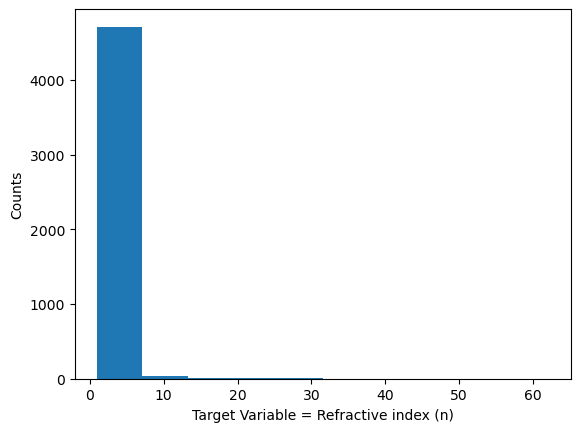

In [5]:
# summary statistics as historgram
plt.plot(figsize=(5,3))
plt.hist(df['n'])
plt.xlabel(r'Target Variable = Refractive index (n)')
plt.ylabel('Counts')
plt.show()

Choose relevant features, which may be based on composition or structure, depending on your problem. [matminer](https://hackingmaterials.lbl.gov/matminer/) is a good place to start.

### Featurizers available:
The input data is just the structure data. This needs to be featurised into numerical data

In [6]:
# Add a composition column to dataframe using the composition property of the Structure class and a lambda function
df['composition'] = df.structure.apply(lambda x: x.composition )

# make a backup copy of df
df_copy = df
df.head()

,structure,n,composition
0,"[[4.29304147 2.4785886 1.07248561] S, [4.2930...",1.752064,"(S, K)"
1,"[[3.95051434 4.51121437 0.28035002] K, [4.3099...",1.652859,"(K, V, O)"
2,"[[-1.78688104 4.79604117 1.53044621] Rb, [-1...",1.867858,"(Rb, Zr, O)"
3,"[[4.51438064 4.51438064 0. ] Mn, [0.133...",2.676887,"(Mn, O, F)"
4,"[[-4.36731958 6.8886097 0.50929706] Li, [-2...",1.793232,"(Li, Co, Si, O)"


Featuriser sets (Link to Automatminer code):
- https://github.com/hackingmaterials/automatminer/blob/main/automatminer/featurization/sets.py
- https://github.com/hackingmaterials/automatminer/blob/main/automatminer/preprocessing/feature_selection.py

In [7]:
# importing the featurisers
import matminer.featurizers.composition as cf
import matminer.featurizers.structure as sf
import matminer.featurizers.conversions as fc

# structure featurisers
cm_featuriser = sf.CoulombMatrix(flatten=True) # coulombic interactions within material as a matrix
cm_featuriser.set_n_jobs(1)

density_featuriser = sf.DensityFeatures()   # Calculates density and density-like features
density_featuriser.set_n_jobs(1)

# composition featurisers
el_prop = cf.ElementProperty.from_preset(preset_name='magpie')
el_prop.set_n_jobs(1)

ion_prop = cf.IonProperty()
ion_prop.set_n_jobs(1)

c:\Users\jwang\anaconda3\Lib\site-packages\matminer\utils\data.py:326: UserWarning: MagpieData(impute_nan=False):
In a future release, impute_nan will be set to True by default.
                    This means that features that are missing or are NaNs for elements
                    from the data source will be replaced by the average of that value
                    over the available elements.
                    This avoids NaNs after featurization that are often replaced by
                    dataset-dependent averages.
  warnings.warn(f"{self.__class__.__name__}(impute_nan=False):\n" + IMPUTE_NAN_WARNING)
c:\Users\jwang\anaconda3\Lib\site-packages\matminer\featurizers\composition\ion.py:161: UserWarning: IonProperty(impute_nan=False):
In a future release, impute_nan will be set to True by default.
                    This means that features that are missing or are NaNs for elements
                    from the data source will be replaced by the average of that value
         

In [8]:
# featurising the compositional data using ElementalProperties
df = el_prop.featurize_dataframe(df, col_id='composition')
df = ion_prop.featurize_dataframe(df, col_id='composition')

# featurising the structural data
df = cm_featuriser.fit_featurize_dataframe(df, col_id='structure') 
df = density_featuriser.fit_featurize_dataframe(df, col_id='structure')

# print the heading of featurisers in the dataframe
print(df.shape)
df.head()

ElementProperty:   0%|          | 0/4764 [00:00<?, ?it/s]

IonProperty:   0%|          | 0/4764 [00:00<?, ?it/s]

c:\Users\jwang\anaconda3\Lib\site-packages\matminer\utils\data.py:380: UserWarning: PymatgenData(impute_nan=False):
In a future release, impute_nan will be set to True by default.
                    This means that features that are missing or are NaNs for elements
                    from the data source will be replaced by the average of that value
                    over the available elements.
                    This avoids NaNs after featurization that are often replaced by
                    dataset-dependent averages.
  warnings.warn(f"{self.__class__.__name__}(impute_nan=False):\n" + IMPUTE_NAN_WARNING)
c:\Users\jwang\anaconda3\Lib\site-packages\matminer\utils\data.py:380: UserWarning: PymatgenData(impute_nan=False):
In a future release, impute_nan will be set to True by default.
                    This means that features that are missing or are NaNs for elements
                    from the data source will be replaced by the average of that value
                    ove

CoulombMatrix:   0%|          | 0/4764 [00:00<?, ?it/s]

DensityFeatures:   0%|          | 0/4764 [00:00<?, ?it/s]

(4764, 429)


,structure,n,composition,MagpieData minimum Number,MagpieData maximum Number,MagpieData range Number,MagpieData mean Number,MagpieData avg_dev Number,MagpieData mode Number,MagpieData minimum MendeleevNumber,...,coulomb matrix eig 281,coulomb matrix eig 282,coulomb matrix eig 283,coulomb matrix eig 284,coulomb matrix eig 285,coulomb matrix eig 286,coulomb matrix eig 287,density,vpa,packing fraction
0,"[[4.29304147 2.4785886 1.07248561] S, [4.2930...",1.752064,"(S, K)",16.0,19.0,3.0,17.500,1.500000,16.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.875648,31.500969,0.774437
1,"[[3.95051434 4.51121437 0.28035002] K, [4.3099...",1.652859,"(K, V, O)",8.0,23.0,15.0,14.000,6.000000,8.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.545995,18.933343,0.975342
2,"[[-1.78688104 4.79604117 1.53044621] Rb, [-1...",1.867858,"(Rb, Zr, O)",8.0,40.0,32.0,23.000,15.000000,8.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.222206,20.330174,1.041441
3,"[[4.51438064 4.51438064 0. ] Mn, [0.133...",2.676887,"(Mn, O, F)",8.0,25.0,17.0,14.000,7.333333,8.0,52.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.411149,11.285192,0.381692
4,"[[-4.36731958 6.8886097 0.50929706] Li, [-2...",1.793232,"(Li, Co, Si, O)",3.0,27.0,24.0,9.875,5.312500,8.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.270411,10.465811,0.537948


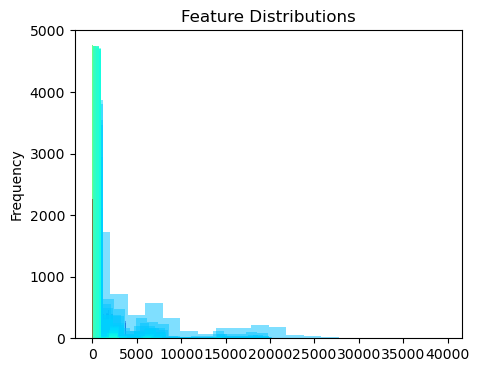

In [12]:
# Extract the feature columns with only numerical data
feature_columns = df.drop(columns=['structure', 'n', 'composition', 'compound possible']).columns

# Create a unique colour for each feature
colors = [plt.cm.jet(i / float(len(feature_columns))) for i in range(len(feature_columns))]

# Plot the distribution of feature values with different colours
plt.figure(figsize=(5, 4))
for i, column in enumerate(feature_columns):
    df[column].plot(kind='hist', bins=20, alpha=0.5, color=colors[i], label=column)

plt.title('Feature Distributions')
plt.show()

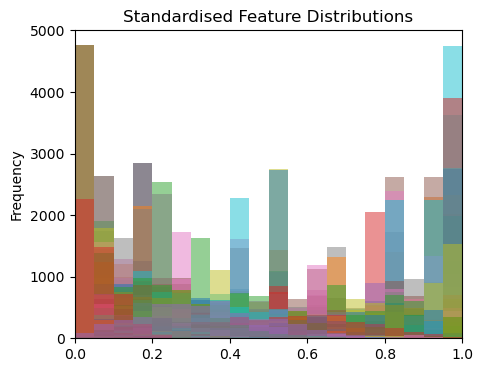

Original shape: (4764, 425)
Reduced shape: (4764, 421)
X shape: (4764, 421)
y shape: (4764,)
We have 425 features in our dataset.
X_train shape: (3811, 421)
y_train shape: (3811,)
X_test shape: (953, 421)
y_test shape: (953,)


In [45]:
# standardising numerical features
from sklearn.preprocessing import MinMaxScaler

scaled_df = df.copy()

# Standardise the feature columns
scaler = MinMaxScaler()
scaled_df[feature_columns] = scaler.fit_transform(scaled_df[feature_columns])

# Plot the standardised feature distributions
plt.figure(figsize=(5, 4))
for column in feature_columns:
    scaled_df[column].plot(kind='hist', bins=20, alpha=0.5, label=column)

plt.title('Standardised Feature Distributions')
plt.xlim(0, 1)
plt.show()

from sklearn.model_selection import train_test_split

# select which features to input (structure, composition = non-numeric; dielectric = target variable)
df = df.dropna() # remove any rows with missing data
input_feats = df[feature_columns].values # input features
y = df["n"].values # select just the refractive index (target variable)

# Removing features with low variance
# by default, this removes all zero-variance features
from sklearn.feature_selection import VarianceThreshold
X = VarianceThreshold().fit_transform(input_feats)
print(f'Original shape: {input_feats.shape}')
print(f'Reduced shape: {X.shape}')

# print the shapes of x and y
print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')
print(f'We have {len(feature_columns)} features in our dataset.')

# Split the data into 80% training and 20% testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the sizes of the arrays
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")

## Model selection, testing and training 

Define your model and justify your choice based on the problem and available data. You can look back at earlier notebooks and investigate other examples online including in [scikit-learn](https://scikit-learn.org).

#### Models availabe:
1. Random forest
    - Ensemble learning: combines predictions and takes an average from multiple trees. Reduces impact of variance in individual trees and less sensitive to outliers
    - Can effectively capture complex non-linear relationships
2. XGBoost
    - High accuracy due to each subsequent tree learns from the error of the previous tree
3. Support Vector Regression (SVR) Machine
    - Good at handling non-linear relationships

Train, validate and test your model. Make sure to do proper data splits and to consider the hyperparamaters of your model.

In [14]:
# importing required modules
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn import svm
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, max_error
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score, cross_validate, cross_val_predict
from sklearn.decomposition import PCA, NMF

# prediction plot function
def make_prediction_plot(X, y, model, name):
    
    y_pred = model.predict(X)
    fig, ax = plt.subplots(figsize=(5, 3))
    plt.scatter(y, y_pred, c=y, cmap='viridis')
    plt.title(f'{name}')
    plt.plot(y, y, 'r-')
    plt.xlabel(f'Refractive index (n) true')
    plt.ylabel(f'Refractive index (n) predicted')
    plt.show()
    
    return y_pred

# print the results
def print_results(X, y, y_pred, model):
    
    print(f'MAE = {mean_absolute_error(y,y_pred):.3f}')
    print(f'RMSE = {np.sqrt(mean_squared_error(y,y_pred)):.3f}')
    print(f'r^2 = {model.score(X,y):.3f}')


Create a baseline linear regression model and random forest model

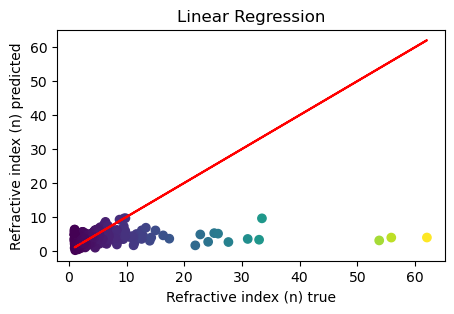

MAE = 0.492
RMSE = 1.870
r^2 = 0.208


In [47]:
# Using a baseline untrained model (lr and rf)
# linear regressor
lr = LinearRegression()
lr.fit(X, y)

# print the results
y_pred_lr = make_prediction_plot(X, y, lr, "Linear Regression")
print_results(X, y, y_pred_lr, lr)

### Training the models
Using GridSearchCV to train and optimise the hyperparameters of the models, completing a kFold=5 cross validation on each

Training a Random Forest model:

In [16]:
# using Random Forest regressor + Cross-validation
rf_model = RandomForestRegressor(n_estimators=100, max_depth=3, random_state=42)
rf_cv_scores = cross_val_score(rf_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
rf_model.fit(X_train, y_train)

#scores
rf_mae = mean_absolute_error(y_test, rf_model.predict(X_test))
rf_rmse = np.sqrt(-rf_cv_scores)  # Convert to RMSE
rf_r2 = r2_score(y_test, rf_model.predict(X_test))

Using XGBoost model:

In [17]:
xgb_model = XGBRegressor(n_estimators=100, max_depth=3, random_state=42, objective='reg:squarederror') 
xgb_cv_scores = cross_val_score(xgb_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
xgb_model.fit(X_train, y_train)

xgb_mae = mean_absolute_error(y_test, xgb_model.predict(X_test))
xgb_rmse = np.sqrt(-xgb_cv_scores)  # Convert to RMSE
xgb_r2 = r2_score(y_test, xgb_model.predict(X_test))

Using SVM Regressor:

In [18]:
svr_model = svm.SVR()
svr_cv_scores = cross_val_score(svr_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
svr_model.fit(X_train, y_train)

svr_mae = mean_absolute_error(y_test, svr_model.predict(X_test))
svr_rmse = np.sqrt(-xgb_cv_scores)  # Convert to RMSE
svr_r2 = r2_score(y_test, svr_model.predict(X_test))

Print the cross-validation results

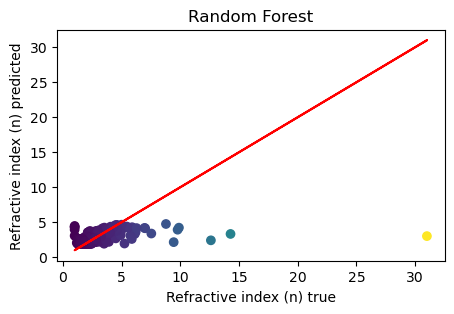


Random Forest Cross-Validation Results
  MAE: 0.359
  Mean RMSE: 2.029
  Standard Deviation of RMSE: 0.600
  R2: 0.266


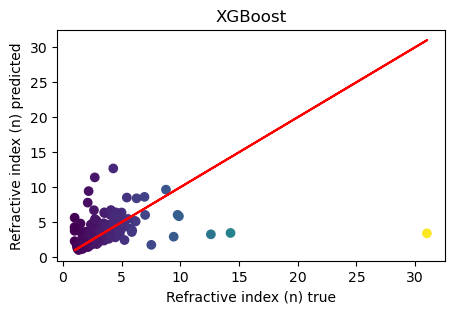


XGBoost Cross-Validation Results
  MAE: 0.397
  Mean RMSE: 2.159
  Standard Deviation of RMSE: 0.557
  R2: 0.188


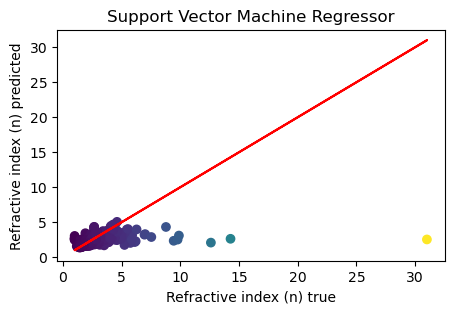


SVR Cross-Validation Results
  MAE: 0.439
  Mean RMSE: 2.159
  Standard Deviation of RMSE: 0.557
  R2: 0.192


In [48]:
# Cross-val prediction plots
make_prediction_plot(X_test, y_test, rf_model, "Random Forest")
# Random Forest results
print("\nRandom Forest Cross-Validation Results")
print(f"  MAE: {rf_mae:.3f}")
print(f"  Mean RMSE: {rf_rmse.mean():.3f}")
print(f"  Standard Deviation of RMSE: {rf_rmse.std():.3f}")
print(f"  R2: {rf_r2:.3f}")

make_prediction_plot(X_test, y_test, xgb_model, "XGBoost")
# XGBoost results
print("\nXGBoost Cross-Validation Results")
print(f"  MAE: {xgb_mae:.3f}")
print(f"  Mean RMSE: {xgb_rmse.mean():.3f}")
print(f"  Standard Deviation of RMSE: {xgb_rmse.std():.3f}")
print(f"  R2: {xgb_r2:.3f}")

make_prediction_plot(X_test, y_test, svr_model, "Support Vector Machine Regressor")
# SVR results
print("\nSVR Cross-Validation Results")
print(f"  MAE: {svr_mae:.3f}")
print(f"  Mean RMSE: {svr_rmse.mean():.3f}")
print(f"  Standard Deviation of RMSE: {svr_rmse.std():.3f}")
print(f"  R2: {svr_r2:.3f}")


### Hyperparameter Optimisation

In [20]:
rf_params = {
    'n_estimators': [20, 60, 100, 200],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 3, 6]
}

rf_grid_search = GridSearchCV(RandomForestRegressor(random_state=42), rf_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
rf_grid_search.fit(X_train, y_train)

best_rf_params = rf_grid_search.best_params_
best_rf_model = rf_grid_search.best_estimator_

In [21]:
xgb_params = {
    'n_estimators': [20, 60, 100, 200],
    'max_depth': [1, 3, 6],
    'learning_rate': [0.1, 0.2, 0.3]
}

xgb_grid_search = GridSearchCV(XGBRegressor(random_state=42), xgb_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
xgb_grid_search.fit(X_train, y_train)

best_xgb_params = xgb_grid_search.best_params_
best_xgb_model = xgb_grid_search.best_estimator_

In [30]:
svr_params = {
    'kernel': ('poly', 'rbf'), # type of kernel used
    'C': [1, 10, 100],  # regularization parameter
    'degree': [2, 3, 4],  # degree of polynomial for 'poly' kernel
}

svr_grid_search = GridSearchCV(svm.SVR(), svr_params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
svr_grid_search.fit(X_train, y_train)

best_svr_params = svr_grid_search.best_params_
best_svr_model = svr_grid_search.best_estimator_

Using Bayesian optimisation (BayesSearchCV) on XGBoost for a more efficient search:

In [ ]:
# bayesian optimization of XGBoost
from skopt import BayesSearchCV
from skopt.space import Real, Integer

# Define search space
xgb_space = {
    'n_estimators': Integer(20, 200),
    'max_depth': Integer(1,10),
    'learning_rate': Real(0.1, 0.3, prior='log-uniform'),
}

# Create XGBoost regressor
xgb_bo = XGBRegressor(n_estimators=100, max_depth=3, random_state=42, objective='reg:squarederror') 

# Perform Bayesian optimization
xgb_search = BayesSearchCV(estimator=xgb_bo, 
                             search_spaces=xgb_space, 
                             n_iter=25, 
                             cv=5, 
                             scoring="neg_mean_squared_error",
                             n_jobs=-1, verbose=2)
xgb_search.fit(X_train, y_train)

# Print best parameters
print(f"Best parameters: {xgb_search.best_params_}")
print(f"Best score: {xgb_search.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits


c:\Users\jwang\anaconda3\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning: The objective has been evaluated at point [0.29999999999999993, 1, 200] before, using random point [0.12866316132076258, 5, 160]
  warnings.warn(


Fitting 5 folds for each of 1 candidates, totalling 5 fits


c:\Users\jwang\anaconda3\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning: The objective has been evaluated at point [0.29999999999999993, 1, 20] before, using random point [0.14060061078849873, 7, 152]
  warnings.warn(


Fitting 5 folds for each of 1 candidates, totalling 5 fits


c:\Users\jwang\anaconda3\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning: The objective has been evaluated at point [0.29999999999999993, 1, 20] before, using random point [0.10376069602610893, 1, 195]
  warnings.warn(


Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Best parameters: OrderedDict({'learning_rate': 0.29999999999999993, 'max_depth': 1, 'n_estimators': 137})
Best score: -4.273966327930647


Model assessment: mean MAE, mean RMSE, max error, R2

In [59]:
# Assessing the best gridsearched models
# Random forest model
rf_test_preds = rf_grid_search.predict(X_test)
rf_mae = mean_absolute_error(y_test,rf_test_preds)
rf_test_rmse = np.sqrt(mean_squared_error(y_test, rf_test_preds))
rf_test_r2 = r2_score(y_test, rf_test_preds)
rf_max = max_error(y_test, rf_test_preds)

# Test the best XGBoost model
bayes_preds = xgb_search.predict(X_test)
bayes_mae = mean_absolute_error(y_test, bayes_preds)
bayes_rmse = np.sqrt(mean_squared_error(y_test, bayes_preds))
bayes_r2 = r2_score(y_test, bayes_preds)
bayes_max_error = max_error(y_test, bayes_preds)

# SVMRegressor
svr_test_preds = svr_grid_search.predict(X_test)
svr_mae = mean_absolute_error(y_test,svr_test_preds)
svr_test_rmse = np.sqrt(mean_squared_error(y_test, svr_test_preds))
svr_test_r2 = r2_score(y_test, svr_test_preds)
svr_max = max_error(y_test, svr_test_preds)


The best Random Forest parameters are: {'min_samples_leaf': 6, 'min_samples_split': 2, 'n_estimators': 100}
The best XGBoost parameters are: OrderedDict({'learning_rate': 0.29999999999999993, 'max_depth': 1, 'n_estimators': 137})
The best SVM Regressor parameters are: {'C': 10, 'degree': 2, 'kernel': 'rbf'}

           Model       MAE      RMSE        R²  max_error
0  Random Forest  0.358852  1.246133  0.257309  27.979399
1        XGBoost  0.401582  1.206073  0.304293  28.153196
2  SVM Regressor  0.439073  1.277736  0.219162  28.362199


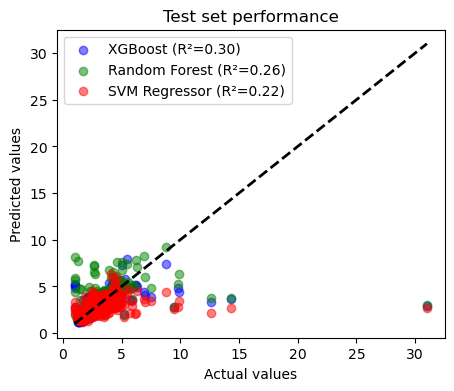

In [63]:
# Print the parameters
print(f'The best Random Forest parameters are: {best_rf_params}')
print(f'The best XGBoost parameters are: {xgb_search.best_params_}')
print(f'The best SVM Regressor parameters are: {best_svr_params}')

# print the results
results = pd.DataFrame({
    'Model': ['Random Forest', 'XGBoost', 'SVM Regressor'],
    'MAE': [rf_mae, bayes_mae, svr_mae],
    'RMSE': [rf_test_rmse, bayes_rmse, svr_test_rmse],
    'R²': [rf_test_r2, bayes_r2, svr_test_r2],
    'max_error': [rf_max, bayes_max_error, svr_max],
})
print(f'\n{results}')

# Create a scatter plot with all models in different colors
plt.figure(figsize=(5, 4))
plt.scatter(y_test, bayes_preds, c='blue', label=f'XGBoost (R²={bayes_r2:.2f})', alpha=0.5)
plt.scatter(y_test, rf_test_preds, c='green', label=f'Random Forest (R²={rf_test_r2:.2f})', alpha=0.5)
plt.scatter(y_test, svr_test_preds, c='red', label=f'SVM Regressor (R²={svr_test_r2:.2f})', alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'k--', lw=2)  # Reference line (y=x)
plt.xlabel("Actual values")
plt.ylabel("Predicted values")
plt.title("Test set performance")
plt.legend()
plt.show()

Model hyperparameters were optimised using GridSearchCV.

Out of the three models, RandomForest showed the lowest MAE and max error.
XGBoost showed the lowest RMSE and highest R2. SVM performed the worst, with the highest MAE, RMSE and max error.

Overall, XGBoost showed the best performance as the lower RMSE shows a lower average measure of magnitude of error, since RMSE gives more weight to points further away from the true value.

### Feature importance:
Dimensionality reduction can be used to further optimise the regression model. One method is using Principle Component Analysis (PCA), where a "principle component" is generated as a linear combination of original features, which aims to capture the most important patterns in the data within a few principle components. This method is great for eliminating noise and redundant data.

Another method is using feature selection. Here, a subset of original features most relevant to the target variable is chosen. This method is great for preserving interpretability and reduces overfitting by removing unecessary variables.

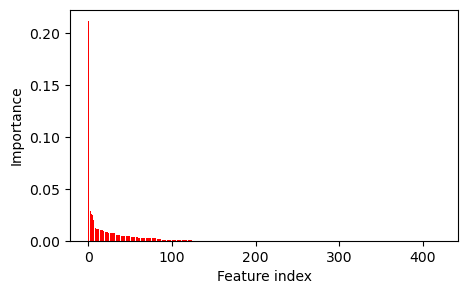

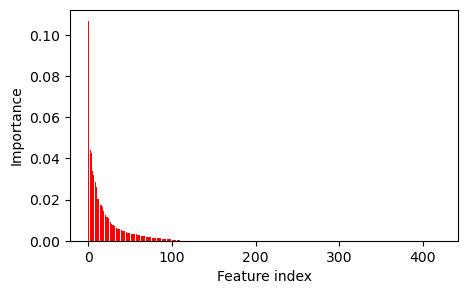

In [64]:
# Get the feature importances
rf_importances = best_rf_model.feature_importances_
xgb_importances = xgb_model.feature_importances_

# Create a bar plot of the feature importance
indices = np.argsort(rf_importances)[::-1]
fig, ax = plt.subplots(figsize=(5, 3))
ax.bar(range(X.shape[1]), rf_importances[indices], color="r", align="center")
ax.set_xlabel("Feature index")
ax.set_ylabel("Importance")
plt.show()

indices = np.argsort(xgb_importances)[::-1]
fig, ax = plt.subplots(figsize=(5, 3))
ax.bar(range(X.shape[1]), xgb_importances[indices], color="r", align="center")
ax.set_xlabel("Feature index")
ax.set_ylabel("Importance")
plt.show()


Using feature importance, it can be seen that:
- Random forest is the most reliant on the most important features (importance > 0.2, greatest difference between most important and 2nd most important)
- XGBoost has a more evenly distributed reliance compared to RF and SVM (smallest difference between the most important and 2nd most important), whilst also depending on less variables as the importance graph falls sharply to zero far before the top 100 features

Taking the top performing model XGBoost, we can plot the top 10 important features as:

C:\Users\jwang\AppData\Local\Temp\ipykernel_4472\2315005631.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(top_feature_names, rotation=45, ha='right', rotation_mode='anchor')


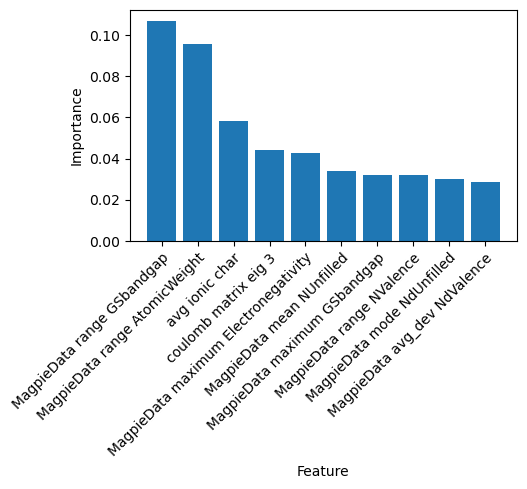

Top 10 Features:
    1. MagpieData range GSbandgap (0.107)
    2. MagpieData range AtomicWeight (0.096)
    3. avg ionic char (0.058)
    4. coulomb matrix eig 3 (0.044)
    5. MagpieData maximum Electronegativity (0.043)
    6. MagpieData mean NUnfilled (0.034)
    7. MagpieData maximum GSbandgap (0.032)
    8. MagpieData range NValence (0.032)
    9. MagpieData mode NdUnfilled (0.030)
    10. MagpieData avg_dev NdValence (0.029)


In [65]:
# Visualise the top N features
N = 10

importances = xgb_importances
# Get the names of the top N important features
indices = np.argsort(importances)[::-1]
top_feature_names = df[feature_columns].columns.values[np.argsort(importances)[::-1][:N]]

fig, ax = plt.subplots(figsize=(5, 3))
ax.bar(x=top_feature_names, height=importances[np.argsort(importances)[::-1][:N]])
ax.set_xlabel("Feature")
ax.set_ylabel("Importance")
ax.set_xticklabels(top_feature_names, rotation=45, ha='right', rotation_mode='anchor')
plt.show()

# Print them too
print(f"Top {N} Features:")
for feat in range(N):
    print(f"    {feat+1}. {feature_columns[indices[feat]]} ({importances[indices[feat]]:.3f})")

In [66]:
# select the top 10 features
X_reduced = df[top_feature_names].values

# Split the data into 80% training and 20% testing
X_train, X_test, y_train, y_test = train_test_split(X_reduced, y, test_size=0.2, random_state=42)

print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (3811, 10)
y_train shape: (3811,)
X_test shape: (953, 10)
y_test shape: (953,)


In [72]:
# build a new XGBoost model with the top 10 features
# Perform Bayesian optimization
xgb_reduced = BayesSearchCV(estimator=xgb_bo, 
                             search_spaces=xgb_space, 
                             n_iter=25, 
                             cv=5, 
                             scoring="neg_mean_squared_error",
                             n_jobs=-1, verbose=2)
xgb_reduced.fit(X_train, y_train)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fi

In [ ]:
# Test the best XGBoost model
reduced_preds = xgb_reduced.predict(X_test)
mae_reduced = mean_absolute_error(y_test,reduced_preds)
rmse_reduced = np.sqrt(mean_squared_error(y_test, reduced_preds))
r2_reduced = r2_score(y_test, reduced_preds)
max_reduced = max_error(y_test, reduced_preds)


# Print the results
print('The performance of the model with the top 10 features:')
print(f'MAE = {mae_reduced:.3f}')
print(f'RMSE = {rmse_reduced:.3f}')
print(f'R² = {r2_reduced:.3f}')
print(f'Max Error = {max_reduced:.3f}')

print(f'\n{results}')

The performance of the model with the top 10 features:
MAE = 0.478
RMSE = 1.248
R² = 0.255
Max Error = 27.416

           Model       MAE      RMSE        R²  max_error
0  Random Forest  0.358852  1.246133  0.257309  27.979399
1        XGBoost  0.401582  1.206073  0.304293  28.153196
2  SVM Regressor  0.439073  1.277736  0.219162  28.362199


Using only the top 10 features, there has been a slight decrease in performance. It can be seen that MAE, RMSE both increased and R2 decreased. However, the max_error has slightly decreased. It is expected that the reduction in input data reduces the accuracy of the model, as XGBoost is less reliant on the most important features compared to random forest. 

However, the results are physically interpretable, where features such as the bandgap, electronegativity, no. of unfilled valence orbitals and one eigenvector of the coulomb matrix, which describes the Coulombic interactions within the atom. These are all connected to the electronic properties of the compound, which is more strongly connected to the dielectric constant compared to other properties such as density or vpa (volume per atom).

## Model analysis and discussion

How well does your final model perform? Think of metrics and plots that are useful to dig a little deeper. 

Compare against the best-performing model on the [MatBench](https://matbench.materialsproject.org) leaderboard.  With limited resources, don't expect to match this performance, but you should do better than a baseline model. 

Comparing to the top model on MatBench (MODNet (v0.1.12)), which showed:
- MAE = 0.2711
- RMSE = 1.6832	
- Max error = 59.1179

And the final model here (XGBoost)
- MAE = 0.397024  
- RMSE = 1.209114 
- Max error = 28.140877

It can be seen that although XGBoost underperformed in terms of MAE, both the RMSE and Max error performance is better. This suggests that XGBoost is better at capturing the variance in predicted data points with large errors. However, the lower MAE metric suggests that XGBoost may be more overfitted compared to MODNet. 

It should also be mentioned that MODNet, which is a forward-feeding neural network, was trained on more data whilst this XGBoost model was trained only on the given dielectric data. Due to having more training data, the neural network will naturally outperform XGBoost, a decision tree based model.

The model can be improved further by investigating a larger range of hyperparameters. Bayesian optimisation is also an alternate method for hyperparameter tuning.

## Large Language Model (LLM) usage declaration

Acknowledge use of a generative model during your assignment. Points to consider:

- GPT-4o was used to summarise the use/application situation for different featurisers.
- Co-Pilot was used to debug some result output functions

## ☘️ Final word

Good luck building your own model! We hope that you enjoyed the course and exercises. Dive deeper into the aspects that caught your interest. A useful starting point may be the [Resources](https://aronwalsh.github.io/MLforMaterials/Resources.html) page. 

Remember that submission is on Blackboard and you should upload both the completed Juypter Notebook (`.ipynb` file), as well as your recorded narrated presentation (maximum 5 minutes; see guides on using [Zoom](https://www.youtube.com/watch?v=H9qhoAIzW3E) or [Powerpoint](https://www.youtube.com/watch?v=Y5dgwwa5XRA) for this purpose).